<a href="https://colab.research.google.com/github/PaulToronto/NYC---Taxi-and-Limousine-Commission/blob/main/TLC_Taxi_Zones.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TLC Taxi Zones

## Imports

In [1]:
!pip install contextily

In [2]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib as mpl

import gdown

import contextily as cx

from pyproj import Transformer

import rasterio as rio
from rasterio.plot import show as rioshow

## Functions

In [3]:
get_data_url = lambda id: rf'https://drive.google.com/uc?id={id}'
gdown_download = lambda id, file_name: gdown.download(get_data_url(id), file_name, quiet=False)

# High Volume For-Hire Vehicle Trips

In [4]:
id = '1rEgVTd1wkF7R5jScMqwAIaX9Fm4w-JzO'
file_name = 'fhv_hv_july_2024.parquet'
gdown_download(id, file_name)

trips = pd.read_parquet(file_name)

Downloading...
From (original): https://drive.google.com/uc?id=1rEgVTd1wkF7R5jScMqwAIaX9Fm4w-JzO
From (redirected): https://drive.google.com/uc?id=1rEgVTd1wkF7R5jScMqwAIaX9Fm4w-JzO&confirm=t&uuid=b90ded1d-1d08-45f3-b810-bb5cf78bf777
To: /content/fhv_hv_july_2024.parquet
100%|██████████| 468M/468M [00:02<00:00, 185MB/s]


In [5]:
trips.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19182934 entries, 0 to 19182933
Data columns (total 24 columns):
 #   Column                Dtype         
---  ------                -----         
 0   hvfhs_license_num     object        
 1   dispatching_base_num  object        
 2   originating_base_num  object        
 3   request_datetime      datetime64[us]
 4   on_scene_datetime     datetime64[us]
 5   pickup_datetime       datetime64[us]
 6   dropoff_datetime      datetime64[us]
 7   PULocationID          int32         
 8   DOLocationID          int32         
 9   trip_miles            float64       
 10  trip_time             int64         
 11  base_passenger_fare   float64       
 12  tolls                 float64       
 13  bcf                   float64       
 14  sales_tax             float64       
 15  congestion_surcharge  float64       
 16  airport_fee           float64       
 17  tips                  float64       
 18  driver_pay            float64       
 19

In [6]:
len(trips['PULocationID'].unique())

262

## Taxi Zone Lookup Dataset

In [7]:
id='1uq2DC9ZhRNx-_4Fsm4bUgv4dS_ZWoJTv'
file_name = 'taxi_zone_lookup.csv'
gdown_download(id, file_name)

taxi_zone_lookup = pd.read_csv(file_name)

Downloading...
From: https://drive.google.com/uc?id=1uq2DC9ZhRNx-_4Fsm4bUgv4dS_ZWoJTv
To: /content/taxi_zone_lookup.csv
100%|██████████| 12.3k/12.3k [00:00<00:00, 8.04MB/s]


In [8]:
taxi_zone_lookup.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 265 entries, 0 to 264
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   LocationID    265 non-null    int64 
 1   Borough       264 non-null    object
 2   Zone          264 non-null    object
 3   service_zone  263 non-null    object
dtypes: int64(1), object(3)
memory usage: 8.4+ KB


In [9]:
taxi_zone_lookup[taxi_zone_lookup['service_zone'].isnull()]

,LocationID,Borough,Zone,service_zone
263,264,Unknown,NaN,NaN
264,265,NaN,Outside of NYC,NaN


In [10]:
len(taxi_zone_lookup['service_zone'].unique()), taxi_zone_lookup['service_zone'].unique()

(5, array(['EWR', 'Boro Zone', 'Yellow Zone', 'Airports', nan], dtype=object))

In [11]:
len(taxi_zone_lookup['Zone'].unique()), taxi_zone_lookup['Zone'].unique()

(262,
 array(['Newark Airport', 'Jamaica Bay', 'Allerton/Pelham Gardens',
        'Alphabet City', 'Arden Heights', 'Arrochar/Fort Wadsworth',
        'Astoria', 'Astoria Park', 'Auburndale', 'Baisley Park',
        'Bath Beach', 'Battery Park', 'Battery Park City', 'Bay Ridge',
        'Bay Terrace/Fort Totten', 'Bayside', 'Bedford', 'Bedford Park',
        'Bellerose', 'Belmont', 'Bensonhurst East', 'Bensonhurst West',
        'Bloomfield/Emerson Hill', 'Bloomingdale', 'Boerum Hill',
        'Borough Park', 'Breezy Point/Fort Tilden/Riis Beach',
        'Briarwood/Jamaica Hills', 'Brighton Beach', 'Broad Channel',
        'Bronx Park', 'Bronxdale', 'Brooklyn Heights',
        'Brooklyn Navy Yard', 'Brownsville', 'Bushwick North',
        'Bushwick South', 'Cambria Heights', 'Canarsie', 'Carroll Gardens',
        'Central Harlem', 'Central Harlem North', 'Central Park',
        'Charleston/Tottenville', 'Chinatown', 'City Island',
        'Claremont/Bathgate', 'Clinton East', 'Clinton

In [12]:
len(taxi_zone_lookup['Borough'].unique()), taxi_zone_lookup['Borough'].unique()

(8,
 array(['EWR', 'Queens', 'Bronx', 'Manhattan', 'Staten Island', 'Brooklyn',
        'Unknown', nan], dtype=object))

## Taxi Zone Geometry

In [13]:
id='1fGdhMuUlq3ZdGlBt8I4w5kIeXiovIBzS'
file_name = 'taxi_zones.zip'
gdown_download(id, file_name)

taxi_zones = gpd.read_file(file_name)

Downloading...
From: https://drive.google.com/uc?id=1fGdhMuUlq3ZdGlBt8I4w5kIeXiovIBzS
To: /content/taxi_zones.zip
100%|██████████| 1.03M/1.03M [00:00<00:00, 15.3MB/s]


In [14]:
taxi_zones.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 263 entries, 0 to 262
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   OBJECTID    263 non-null    int32   
 1   Shape_Leng  263 non-null    float64 
 2   Shape_Area  263 non-null    float64 
 3   zone        263 non-null    object  
 4   LocationID  263 non-null    int32   
 5   borough     263 non-null    object  
 6   geometry    263 non-null    geometry
dtypes: float64(2), geometry(1), int32(2), object(2)
memory usage: 12.5+ KB


In [15]:
taxi_zones.head(1)

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((933100.918 192536.086, 933091.011 19..."


In [16]:
len(taxi_zones['zone'].unique()), taxi_zones['zone'].unique()

(260,
 array(['Newark Airport', 'Jamaica Bay', 'Allerton/Pelham Gardens',
        'Alphabet City', 'Arden Heights', 'Arrochar/Fort Wadsworth',
        'Astoria', 'Astoria Park', 'Auburndale', 'Baisley Park',
        'Bath Beach', 'Battery Park', 'Battery Park City', 'Bay Ridge',
        'Bay Terrace/Fort Totten', 'Bayside', 'Bedford', 'Bedford Park',
        'Bellerose', 'Belmont', 'Bensonhurst East', 'Bensonhurst West',
        'Bloomfield/Emerson Hill', 'Bloomingdale', 'Boerum Hill',
        'Borough Park', 'Breezy Point/Fort Tilden/Riis Beach',
        'Briarwood/Jamaica Hills', 'Brighton Beach', 'Broad Channel',
        'Bronx Park', 'Bronxdale', 'Brooklyn Heights',
        'Brooklyn Navy Yard', 'Brownsville', 'Bushwick North',
        'Bushwick South', 'Cambria Heights', 'Canarsie', 'Carroll Gardens',
        'Central Harlem', 'Central Harlem North', 'Central Park',
        'Charleston/Tottenville', 'Chinatown', 'City Island',
        'Claremont/Bathgate', 'Clinton East', 'Clinton

In [17]:
len(taxi_zones['borough'].unique()), taxi_zones['borough'].unique()

(6,
 array(['EWR', 'Queens', 'Bronx', 'Manhattan', 'Staten Island', 'Brooklyn'],
       dtype=object))

### CRS

In [18]:
taxi_zones.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US survey foot)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

### Simple `add_basemap`

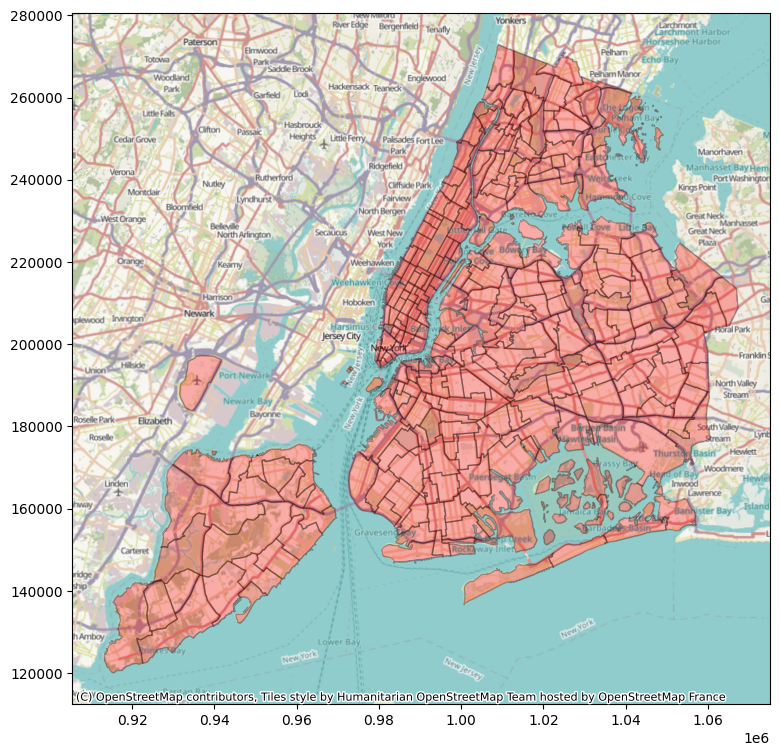

In [19]:
ax = taxi_zones.plot(color='red', edgecolor='black', alpha=0.3, figsize=(9, 9))
cx.add_basemap(ax, crs=taxi_zones.crs)

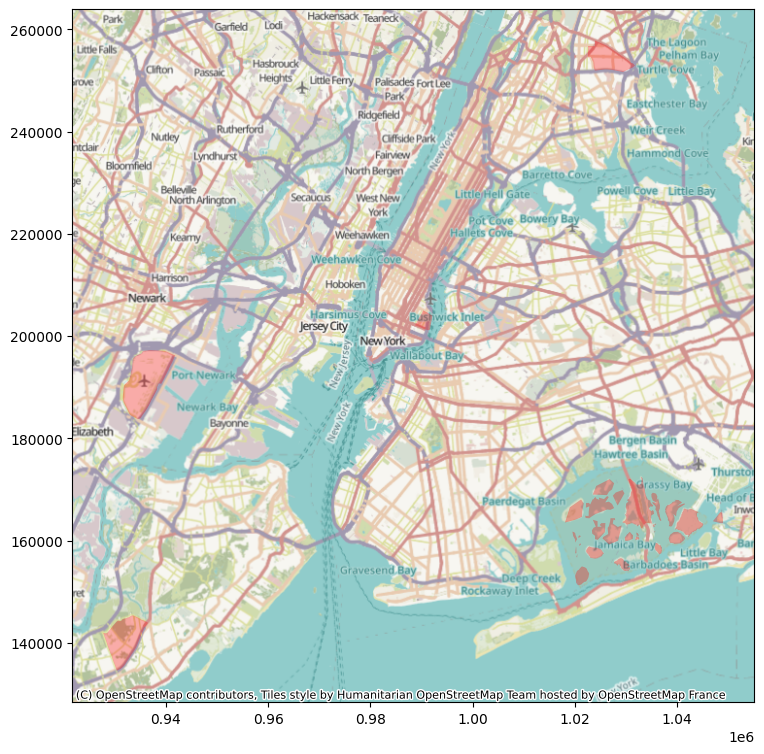

In [20]:
ax = taxi_zones.head().plot(color='red', alpha=0.3, figsize=(9, 9))
cx.add_basemap(ax, crs=taxi_zones.crs)

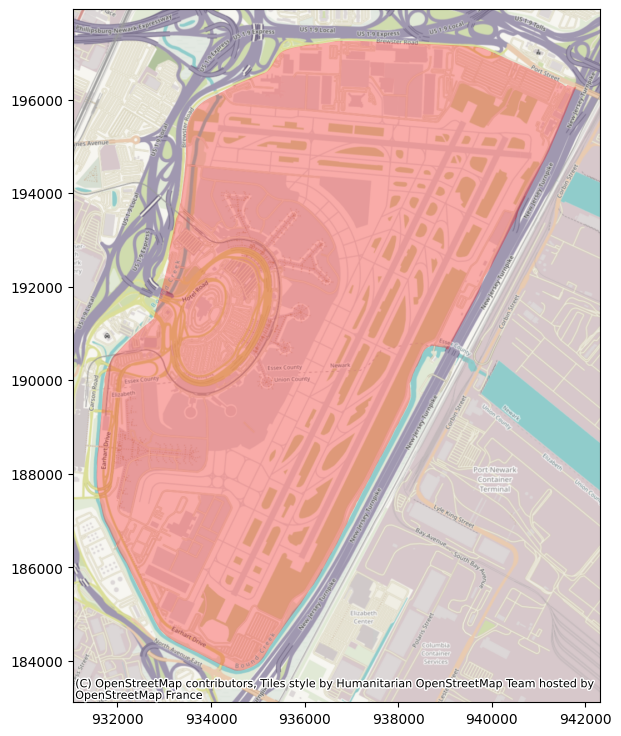

In [21]:
ax = taxi_zones.head(1).plot(color='red', alpha=0.3, figsize=(9, 9))
cx.add_basemap(ax, crs=taxi_zones.crs)

### Providers

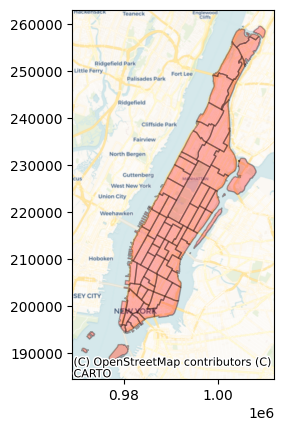

In [22]:
ax = taxi_zones.query('borough == "Manhattan"').plot(color='red',
                                                     alpha=0.3,
                                                     edgecolor='black')
cx.add_basemap(ax,
               crs=taxi_zones.crs,
               source=cx.providers.CartoDB.Voyager)

### Bounds

In [23]:
taxi_zones.bounds.min()

,0
minx,913175.109009
miny,120121.881254
maxx,927093.439518
maxy,142339.851827


In [24]:
taxi_zones.bounds.max()

,0
minx,1.059350e+06
miny,2.627176e+05
maxx,1.067383e+06
maxy,2.728443e+05


In [25]:
# west, south, east, north
w, s, _, _ = taxi_zones.bounds.min()
_, _, e, n = taxi_zones.bounds.max()

w, s, e, n

(913175.109008804, 120121.88125434518, 1067382.508405164, 272844.2940054685)

In [26]:
# could have used this
taxi_zones.total_bounds

array([ 913175.1090088 ,  120121.88125435, 1067382.50840516,
        272844.29400547])

In [27]:
transformer = Transformer.from_crs(taxi_zones.crs, 'EPSG:3857')
w, s, e, n = transformer.transform_bounds(w, s, e, n)
w, s, e, n

(-8266269.124830261, 4938282.473035961, -8204159.10611518, 4999895.860089847)

In [28]:
ny_img, ny_ext = cx.bounds2img(w, s, e, n, ll=False, source=cx.providers.CartoDB.Voyager)

In [29]:
ny_img.shape

(1024, 1024, 4)

In [30]:
ny_ext

(-8277212.918945165, -8198941.401981145, 4931105.568733288, 5009377.08569731)

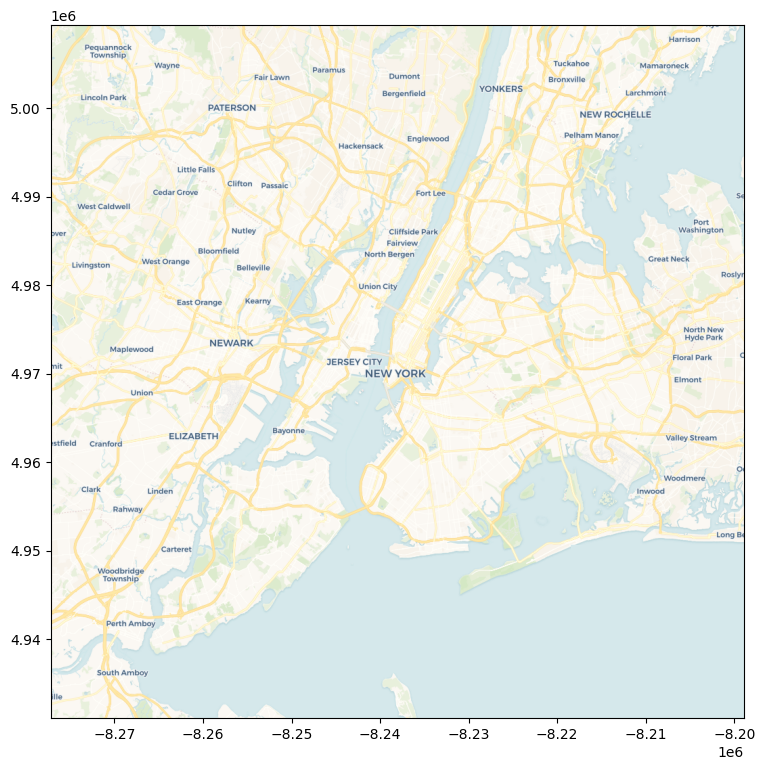

In [31]:
f, ax = plt.subplots(1, figsize=(9, 9))
ax.imshow(ny_img, extent=ny_ext);

### Place

In [32]:
ny = cx.Place('New York, NY', source=cx.providers.OpenStreetMap.Mapnik)
ny

Place : City of New York, New York, United States | n_tiles: 1 | zoom : 11 | im : (1024, 1024)

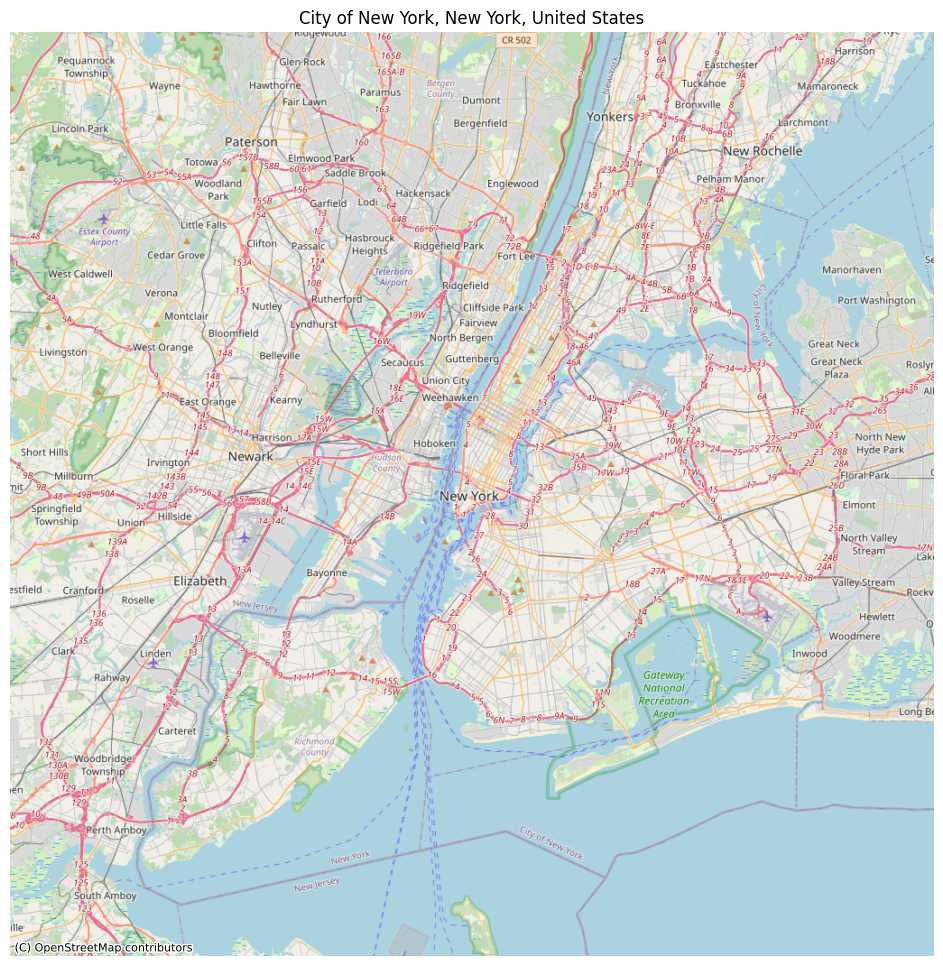

In [33]:
ny.plot();

### Storing basemaps locally

In [34]:
ny = cx.Place('New York, NY', source=cx.providers.OpenStreetMap.Mapnik, path='ny.tiff')

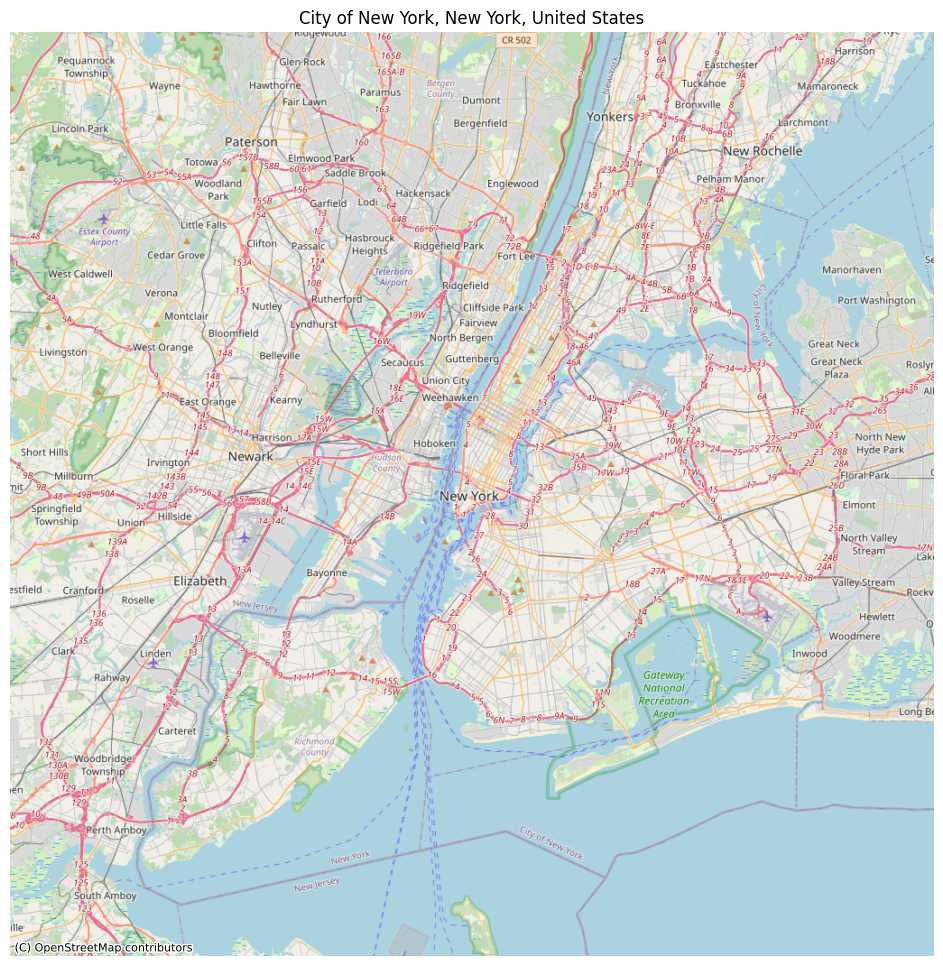

In [35]:
ny.plot();

EPSG:3857


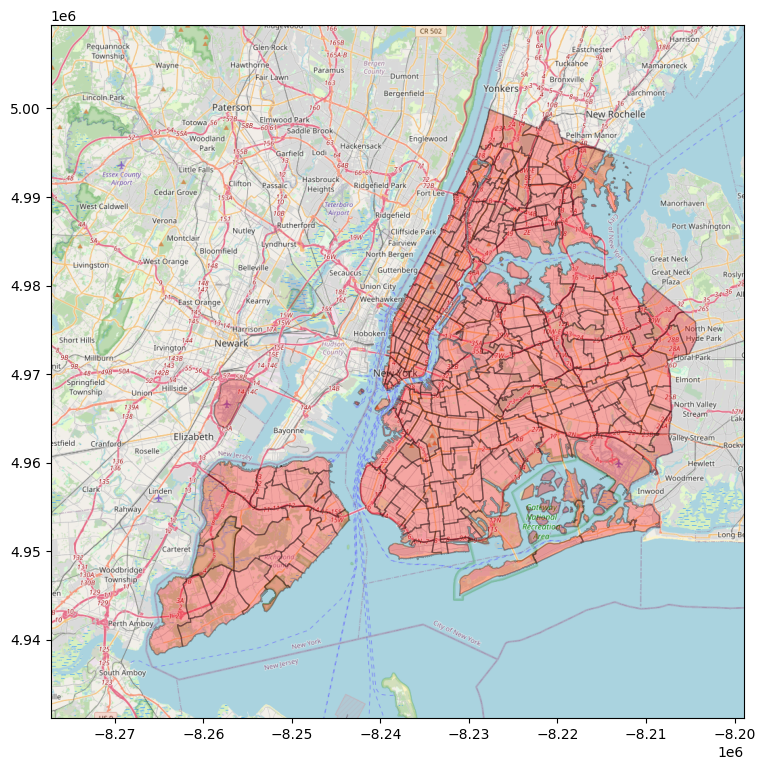

In [36]:
fig, ax = plt.subplots(1, figsize=(9, 9))

with rio.open('ny.tiff') as r:
    rioshow(r, ax=ax)

    if taxi_zones.crs != r.crs:
        taxi_zones2 = taxi_zones.to_crs(r.crs)


    taxi_zones2.plot(color='red',
                    edgecolor='black',
                    alpha=0.3, ax=ax)

    # set plot limits to match the raster extent
    ax.set_xlim(r.bounds.left, r.bounds.right)
    ax.set_ylim(r.bounds.bottom, r.bounds.top)
    print(r.crs)

plt.show()

In [37]:
taxi_zones.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US survey foot)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [38]:
taxi_zones2.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

### Plotting points defined by latitude and longitude on a contextily basemap

In [39]:
taxi_zones['centroid'] = taxi_zones['geometry'].centroid
taxi_zones2['centroid'] = taxi_zones2['geometry'].centroid
taxi_zones.head(1)

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry,centroid
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((933100.918 192536.086, 933091.011 19...",POINT (935996.821 191376.75)


In [40]:
data = taxi_zones.head(1)

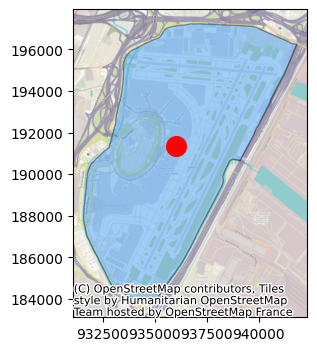

In [41]:
fig, ax = plt.subplots(figsize=(4, 4))

data.plot(color='dodgerblue', alpha=0.4, edgecolor='black', ax=ax)
ax.scatter(data['centroid'].x, data['centroid'].y, color='red', s=200);

cx.add_basemap(ax=ax, crs=taxi_zones.crs)

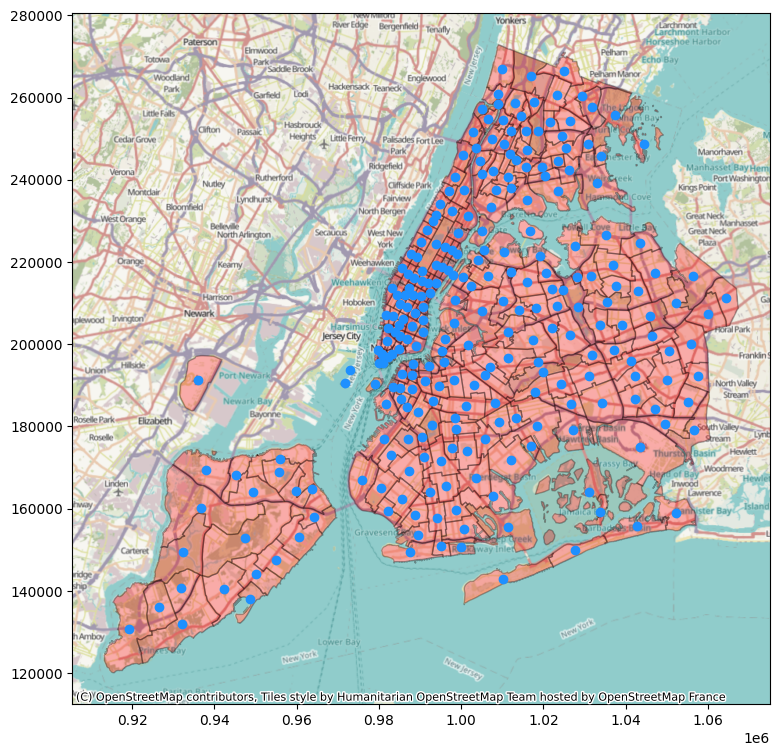

In [42]:
fig, ax = plt.subplots(figsize=(9, 9))

taxi_zones.plot(ax=ax, color='red', alpha=0.3, edgecolor='black')
taxi_zones['centroid'].plot(ax=ax, color='dodgerblue')
cx.add_basemap(ax, crs=taxi_zones.crs)

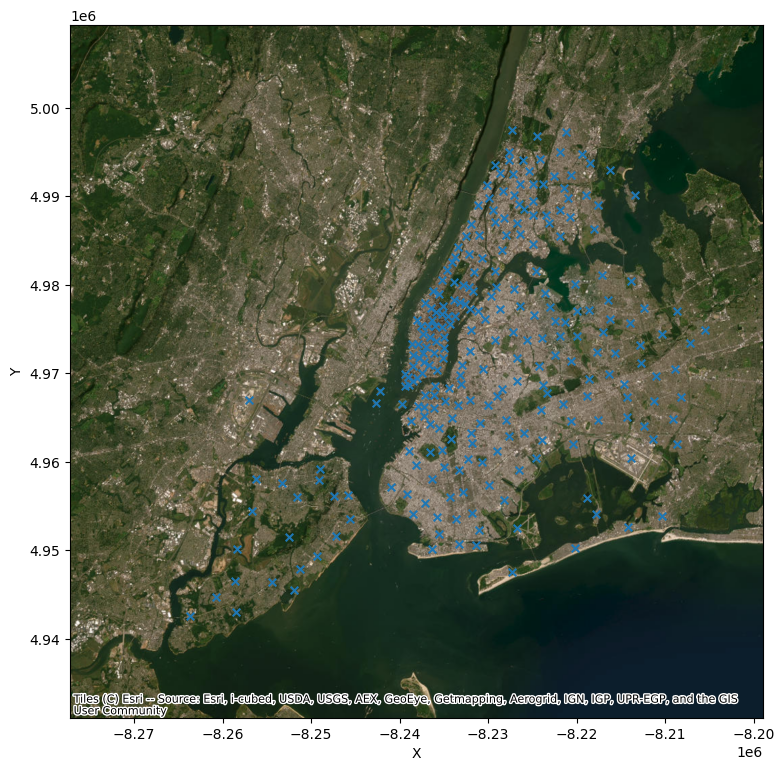

In [43]:
ny = cx.Place('New York, NY',
              source=cx.providers.Esri.WorldImagery)

fig, ax = plt.subplots(figsize=(9, 9), dpi=100)

ny.plot(ax=ax)
ax.scatter(x=taxi_zones2['centroid'].x, y=taxi_zones2['centroid'].y, s=30, marker='x');

### Transparent Layers

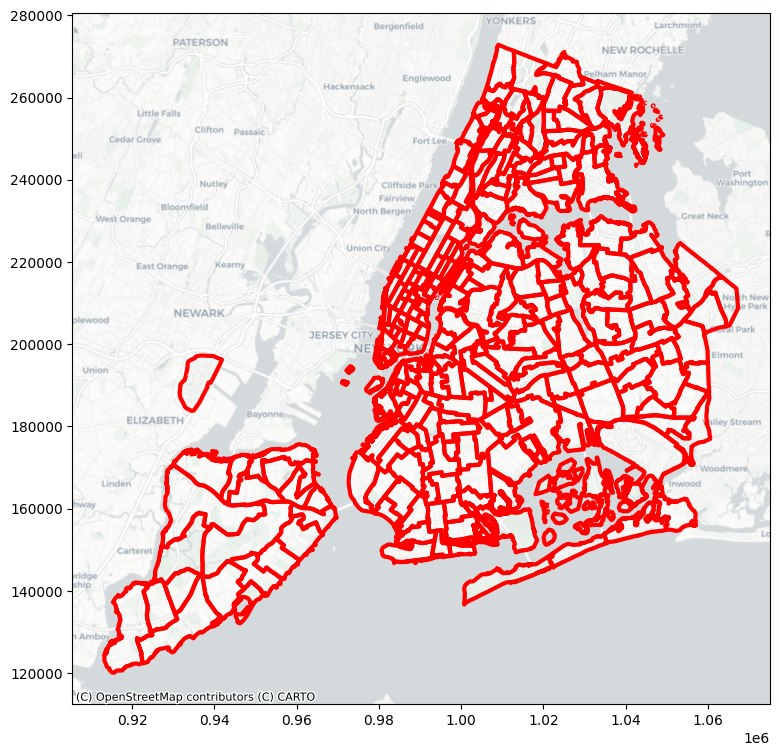

In [44]:
ax = taxi_zones.plot(figsize=(9, 9), color='none', edgecolor='r', linewidth=3)
cx.add_basemap(ax, crs=taxi_zones.crs, source=cx.providers.CartoDB.Positron)

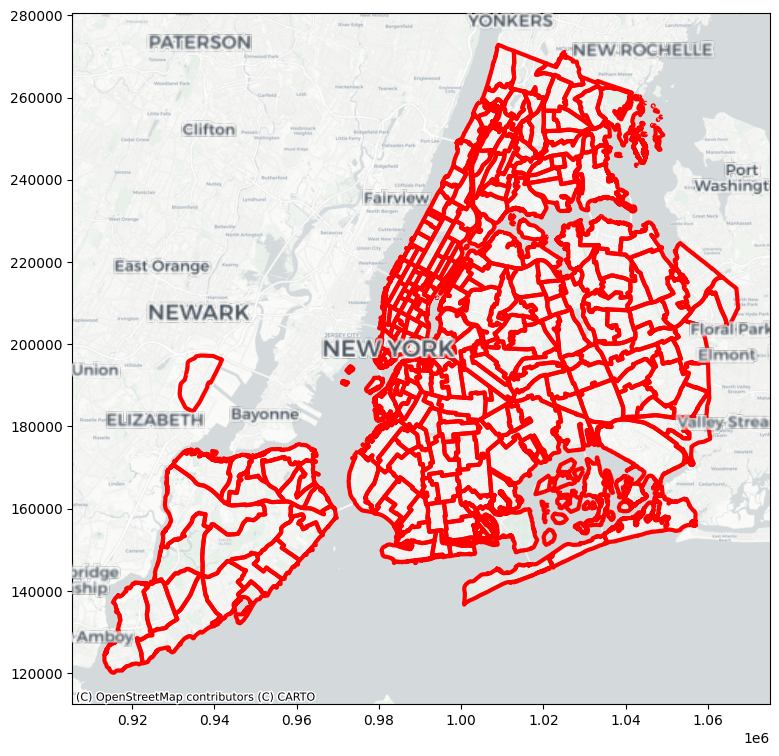

In [45]:
# this only works if the tile provider makes partially transparent
#. labels available
ax = taxi_zones.plot(figsize=(9, 9), color='none', edgecolor='r', linewidth=3)
cx.add_basemap(ax, crs=taxi_zones.crs, source=cx.providers.CartoDB.Positron, zoom=12)
# optionally you can use different zoom levels for the layers
cx.add_basemap(ax, crs=taxi_zones.crs, source=cx.providers.CartoDB.PositronOnlyLabels, zoom=10)

### Choropleth

In [46]:
pickup = trips['PULocationID'].value_counts()
pickup.name = 'Number_Pickups'

In [47]:
dropoff = trips['DOLocationID'].value_counts()
dropoff.name = 'Number_Drop_Offs'

In [48]:
taxi_zones_merged = taxi_zones.merge(
    pickup,
    left_on='LocationID',
    right_on='PULocationID',
    how='inner').merge(
        dropoff,
        left_on='LocationID',
        right_on='DOLocationID',
        how='inner'
    )

taxi_zones_merged

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry,centroid,Number_Pickups,Number_Drop_Offs
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((933100.918 192536.086, 933091.011 19...",POINT (935996.821 191376.75),2,130475
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,"MULTIPOLYGON (((1033269.244 172126.008, 103343...",POINT (1031085.719 164018.754),57,60
2,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((1026308.77 256767.698, 1026495.593 2...",POINT (1026452.617 254265.479),42052,40347
3,4,0.043567,0.000112,Alphabet City,4,Manhattan,"POLYGON ((992073.467 203714.076, 992068.667 20...",POINT (990633.981 202959.782),57932,48530
4,5,0.092146,0.000498,Arden Heights,5,Staten Island,"POLYGON ((935843.31 144283.336, 936046.565 144...",POINT (931871.37 140681.351),5953,5237
...,...,...,...,...,...,...,...,...,...,...
255,259,0.126750,0.000395,Woodlawn/Wakefield,259,Bronx,"POLYGON ((1025414.782 270986.139, 1025138.624 ...",POINT (1025106.231 266453.415),63516,49376
256,260,0.133514,0.000422,Woodside,260,Queens,"POLYGON ((1011466.966 216463.005, 1011545.889 ...",POINT (1010211.977 210434.892),85160,86888
257,261,0.027120,0.000034,World Trade Center,261,Manhattan,"POLYGON ((980555.204 196138.486, 980570.792 19...",POINT (980639.512 197635.174),74040,72537
258,262,0.049064,0.000122,Yorkville East,262,Manhattan,"MULTIPOLYGON (((999804.795 224498.527, 999824....",POINT (999064.725 221974.401),64360,53355


In [49]:
vmin = taxi_zones_merged[['Number_Pickups', 'Number_Drop_Offs']].min().min()
vmax = taxi_zones_merged[['Number_Pickups', 'Number_Drop_Offs']].max().max()
vmin, vmax

(1, 446384)

In [50]:
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
type(norm)

matplotlib.colors.Normalize

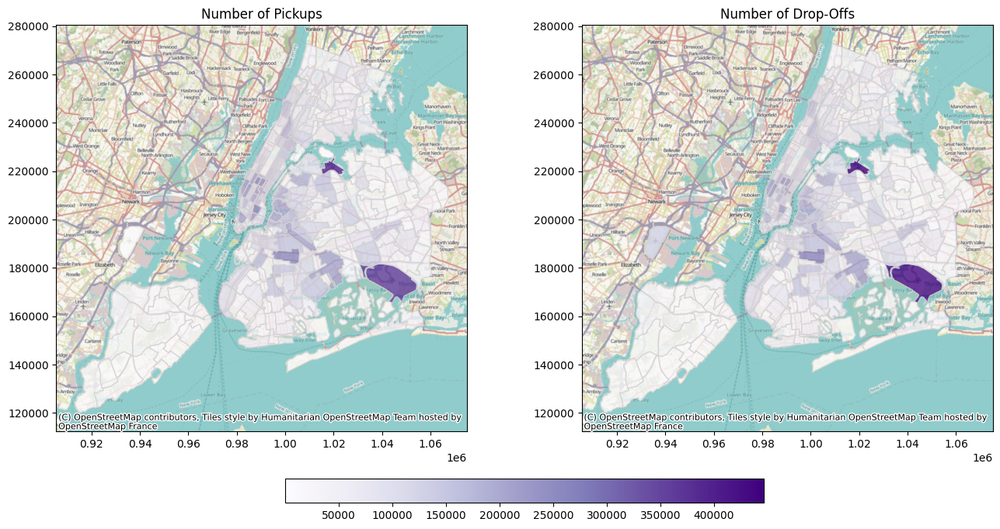

In [51]:
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

taxi_zones_merged.plot(column='Number_Pickups',
                       ax=ax[0],
                       edgecolor='lightgray',
                       cmap='Purples',
                       alpha=0.8,
                       vmin=vmin,
                       vmax=vmax,
                       legend=False)
taxi_zones_merged.plot(column='Number_Drop_Offs',
                       ax=ax[1],
                       edgecolor='lightgray',
                       cmap='Purples',
                       alpha=0.8,
                       vmin=vmin,
                       vmax=vmax,
                       legend=False)

sm = plt.cm.ScalarMappable(cmap='Purples', norm=norm)
sm.set_array([])
fig.colorbar(sm, ax=ax, orientation='horizontal', fraction=0.05, pad=0.1)

cx.add_basemap(ax=ax[0], crs=taxi_zones_merged.crs)
cx.add_basemap(ax=ax[1], crs=taxi_zones_merged.crs)

ax[0].set_title('Number of Pickups')
ax[1].set_title('Number of Drop-Offs')

plt.show()

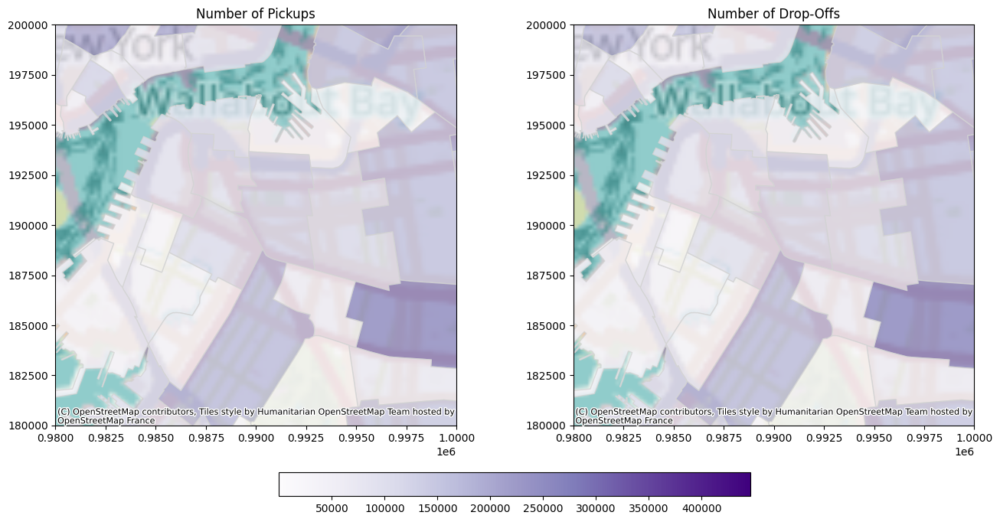

In [52]:
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

taxi_zones_merged.plot(column='Number_Pickups',
                       ax=ax[0],
                       edgecolor='lightgray',
                       cmap='Purples',
                       alpha=0.8,
                       vmin=vmin,
                       vmax=vmax,
                       legend=False)
taxi_zones_merged.plot(column='Number_Drop_Offs',
                       ax=ax[1],
                       edgecolor='lightgray',
                       cmap='Purples',
                       alpha=0.8,
                       vmin=vmin,
                       vmax=vmax,
                       legend=False)

sm = plt.cm.ScalarMappable(cmap='Purples', norm=norm)
sm.set_array([])
fig.colorbar(sm, ax=ax, orientation='horizontal', fraction=0.05, pad=0.1)

cx.add_basemap(ax=ax[0], crs=taxi_zones_merged.crs)
cx.add_basemap(ax=ax[1], crs=taxi_zones_merged.crs)

ax[0].set_title('Number of Pickups')
ax[1].set_title('Number of Drop-Offs')

ax[0].set_xlim(.98 * 10e5, 1 * 10e5)
ax[0].set_ylim(180000, 200000)

ax[1].set_xlim(.98 * 10e5, 1 * 10e5)
ax[1].set_ylim(180000, 200000)

plt.show()